Two years ago, I've had the pleasure to take a Harvard class entitled [Science & Cooking: From Haute Cuisine to Soft Matter Science (part 1)](https://www.edx.org/course/science-cooking-from-haute-cuisine-to-soft-matter) on edx, a MOOC platform.

This has lead me to do some fun kitchen science, in particular trying to [cook an egg using math formulas](https://flothesof.github.io/cooking-egg-math.html) (spoiler: it was not successful).

One of the tools introduced by the class is the [Cook my Meat App](http://up.csail.mit.edu/science-of-cooking/). The app allows you to specify a cooking protocol for meat modelled as a 1D medium. Ever since seing this app, I thought it would be nice to replicate it with my own tools and learn from it. This post is the attempt to do just this. 

I'll try to go from the theory, that is the heat equation in 1D, to the implementation using the Crank-Nicolson time stepping method. In the end, we'll try to compare our results with these from the app (and they'll hopefully be the same).

# The 1D heat equation and the Crank-Nicolson method  

## The heat equation using the Crank-Nicolson discretization

The problem tackled by the Cook my Meat app is that of cooking a steak. The steak has thickness $L$ and is heated on one side by a heat source, while being in contact with the outside air on the other side. It also starts at a given initial temperature.

Our problem consists of solving for the temperature distribution as a function of time. The temperature evolution is governed by the 1D heat equation, written as 

$$
\frac{\partial T}{\partial t} = D \frac{\partial^2 T}{\partial x^2} 
$$

The physical interpretation of this equation is that heat flows through space along the $x$ coordinate at a rate that is proportional to the diffusion constant $D$ and to the local second derivative with respect to space of temperature. 

The Crank-Nicolson method consists, when discretizing the continuous temperature field to a $N + 1$ nodes grid (with notation $T_i^n$, where $i$ represents the space dimension and $n$ the time dimension), to use the following equations

$$
\frac{T_i^{n+1} - T_i^{n}}{\Delta t} = \dfrac{1}{2} \left [ D \frac{T_{i+1}^{n} - 2 T_{i}^{n} + T_{i-1}^{n}}{\Delta x^2} + D \frac{T_{i+1}^{n+1} - 2 T_{i}^{n+1} + T_{i-1}^{n+1}}{\Delta x^2}\right ] \, \forall i \in [1, N-1]
$$

Rearranging terms to have time $n+1$ on the left and time $n$ on the right and using the notation $\sigma = \frac{D \Delta t}{2 \Delta x ^2}$, this equation becomes

$$
- \sigma T_{i-1}^{n+1} + (1 + 2 \sigma) T_{i}^{n+1} - \sigma T_{i+1}^{n+1} = - \sigma T_{i-1}^{n} + (1 - 2 \sigma) T_{i}^{n} - \sigma T_{i+1}^{n}
$$

## Boundary conditions

However, our problem still lacks boundary conditions. The two edges can have either a fixed temperature or a zero heat flux condition, depending on whether there is heat transfer (through a pan for instance, fixed temperature) or not (contact with air, zero heat flux).

To write the boundary conditions properly, we will use a little trick based on the above equation. Let's tackle the left boundary first. Writing the equation for $i=0$, we obtain:

$$
- \sigma T_{-1}^{n+1} + (1 + 2 \sigma) T_{0}^{n+1} - \sigma T_{1}^{n+1} = - \sigma T_{-1}^{n} + (1 - 2 \sigma) T_{0}^{n} - \sigma T_{1}^{n}
$$

The peculiar thing here is the appearance of a *virtual* node of index -1. 
If we wish to have a zero heat flux condition at the left boundary, written $\frac{\partial T}{\partial x} = 0$, we have to use the fact 


$$
\frac{T_{0}^{n+1} - T_{-1}^{n+1}}{\Delta x} = \frac{T_{0}^{n} - T_{-1}^{n}}{\Delta x} = 0
$$

This allows us to obtain


$$
(1 + \sigma) T_{0}^{n+1} -\sigma T_{1}^{n+1} = (1 - \sigma) T_{0}^{n} - \sigma T_{1}^{n} 
$$

In the case of a fixed temperature on the left, denoted $T_l$, we can just write $T_{0}^{n+1} = T_l$ and put it on the first line of the system.


Doing the same thing at the right boundary yields the following formula in the case of zero heat flux right boundary


$$
-\sigma T_{N}^{n+1} (1 + \sigma) T_{N+1}^{n+1}  = -\sigma T_{N}^{n} (1 - \sigma) T_{N+1}^{n}
$$

and $T_{N}^{n+1} = T_r$ on the last line of the linear system.

## Assembling the whole system

Finally, the whole system becomes 

$$
A \underline{T}^{n+1} = B \underline{T}^{n} + C
$$

Assuming the matrix $B$ is invertible, the solution at timestep $n+1$ is obtained by 

$$
 \underline{T}^{n+1} =  A^{-1} (B \underline{T}^n + C)
$$

Since material parameters are constant, we can compute $B^{-1} A$ only once and then apply it repeatedly, which should be computationally efficient.

# Implementation using Python 

Units used for the implementation: millimeters, seconds, °C.

In this unit, the heat diffusion constant of water (to which steak is assimilated) is $D = 0.14$ (in mm^2/sec).

In [1]:
import numpy as np
from enum import Enum

class BC:
    HEATING_LEFT = 0
    HEATING_RIGHT = 1
    HEATING_BOTH = 2
    NO_HEATING = 3

def assemble_A_matrix(N, D, dx, dt, boundary_condition):
    sigma = D * dt / (2 * dx**2)
    A = np.zeros((N+1, N+1))
    for i in range(N+1):
        if i == 0:
            # imposed temperature
            if boundary_condition == BC.HEATING_LEFT or boundary_condition == BC.HEATING_BOTH:
                A[i, i] =  1
            # zero heat flux    
            elif boundary_condition == BC.HEATING_RIGHT or boundary_condition == BC.NO_HEATING:
                A[i, 0] = 1 + sigma
                A[i, 1] = - sigma
        elif i==N:
            # imposed temperature
            if boundary_condition == BC.HEATING_RIGHT or boundary_condition == BC.HEATING_BOTH:
                A[i, i] = 1
            # zero heat flux
            elif boundary_condition == BC.HEATING_LEFT or boundary_condition == BC.NO_HEATING:
                A[i, i-1] = - sigma
                A[i,   i] = 1 + sigma
        else:
            A[i, i-1] =       - sigma
            A[i,   i] = 1 + 2 * sigma
            A[i, i+1] =       - sigma
    return A

def assemble_B_matrix(N, D, dx, dt, boundary_condition):
    sigma = D * dt / (2 * dx**2)
    B = np.zeros((N+1, N+1))
    for i in range(N+1):
        if i == 0:
            # imposed temperature
            if boundary_condition == BC.HEATING_LEFT or boundary_condition == BC.HEATING_BOTH:
                B[i, 0] =   0
            # zero heat flux    
            elif boundary_condition == BC.HEATING_RIGHT or boundary_condition == BC.NO_HEATING:
                B[i, 0] = 1 - sigma
                B[i, 1] =     sigma
        elif i==N:
            # imposed temperature
            if boundary_condition == BC.HEATING_RIGHT or boundary_condition == BC.HEATING_BOTH:
                B[i, i] = 0
            # zero heat flux
            elif boundary_condition == BC.HEATING_LEFT or boundary_condition == BC.NO_HEATING:
                B[i, i-1] =     sigma
                B[i,   i] = 1 - sigma
        else:
            B[i, i-1] =         sigma
            B[i,   i] = 1 - 2 * sigma
            B[i, i+1] =         sigma
    return B

def assemble_C_matrix(N, D, dx, dt, boundary_condition, Tl, Tr):
    sigma = D * dt / (2 * dx**2)
    C = np.zeros((N+1,))
    if boundary_condition == BC.HEATING_LEFT or boundary_condition == BC.HEATING_BOTH:
        C[0] = Tl
    if boundary_condition == BC.HEATING_RIGHT or boundary_condition == BC.HEATING_BOTH:
        C[N] = Tr
    return C

def bc_type_checker(Tl, Tr, Tair):
    EPS = 0.001
    if abs(Tl - Tair) < EPS and abs(Tr - Tair) < EPS:
        return BC.NO_HEATING
    elif abs(Tl - Tair) < EPS:
        return BC.HEATING_RIGHT
    elif abs(Tr - Tair) < EPS:
        return BC.HEATING_LEFT
    else:
        return BC.HEATING_BOTH

class CrankNicolsonSolver:
    def __init__(self, x, T_initial, dt, D):
        self.t = 0
        self.dt = dt
        self.x = np.asarray(x).copy()
        self.T = np.asarray(T_initial).copy()
        self.N = self.x.size - 1
        self.dx = self.x[1] - self.x[0]
        self.bc_is_set = False
        self.D = D
        self.last_bc = None
        
    def set_boundary_conditions(self, Tl, Tr, Tair):
        if self.last_bc is not None:
            if self.last_bc == (Tl, Tr, Tair):
                return
        bc = bc_type_checker(Tl, Tr, Tair)
        print(f'[Set_BC] bc found: {bc}')
        A = assemble_A_matrix(self.N, self.D, self.dx, self.dt, bc)
        self.B = assemble_B_matrix(self.N, self.D, self.dx, self.dt, bc)
        self.C = assemble_C_matrix(self.N, self.D, self.dx, self.dt, bc, Tl, Tr)
        print(f"[Set_BC] inverting matrix A with conditioning {np.linalg.cond(A)}")
        self.Ainv = np.linalg.inv(A)
        self.bc_is_set = True
        self.last_bc = (Tl, Tr, Tair)
        
    def step(self):
        assert self.bc_is_set
        self.T = np.dot(self.Ainv, np.dot(self.B, self.T) + self.C)
        self.t += self.dt
        
    def n_steps(self, n):
        for i in range(n):
            self.step()
            
KELVIN  = 273.15            
x = np.linspace(0, 30, num=200) # 30 mm steak
T_initial = np.ones_like(x) * (23 + KELVIN) + np.exp(-(x - 10)**2) # °C
T_hot = 45 + KELVIN
T_cold = 23 + KELVIN
T_air = 23 + KELVIN
dt = 0.01
D = 0.14
solver = CrankNicolsonSolver(x, T_initial, dt, D)
solver.set_boundary_conditions(T_hot, T_cold, T_air)
solver.step()

[Set_BC] bc found: 0
[Set_BC] inverting matrix A with conditioning 1.128870185277235


Let's look at the solver output after a couple of steps for this sample initialization:

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
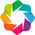

In [2]:
import holoviews as hv
hv.extension('bokeh')
hv.opts.defaults(hv.opts.QuadMesh(colorbar=True, width=700, tools=['hover'], cmap='viridis'))

In [3]:
solver.n_steps(10000)

hv.Curve(solver.T - KELVIN)

:Curve   [x]   (y)

With the solver in place, we can use it to simulate some cooking.

First, we're going to make some functions that allow us to visualize the heat diffusion process.

Then, we'll adapt our solver to inputs from the Cook my Meat App.

# Visualizing the heat flow on reference cases

To verify that our solver is doing the right thing, we're going to simulate some reference cases:

- fixed temperature left / zero flux on the right
- zero flux left / zero flux right with bumpy initial conditions

In [4]:
nx = 50
solver_params = dict(x=np.linspace(0, 30, num=nx), 
                     T_initial=np.ones_like(np.linspace(0, 30, num=nx)) * (23 + KELVIN), 
                     dt=.0001, 
                     D=0.14)

boundary_conditions = dict(Tl=150 + KELVIN, 
                           Tr=23 + KELVIN, 
                           Tair=23 + KELVIN)

def make_snapshots(solver_params, boundary_conditions, tmax, n_snapshots, M=20):
    time_grid = np.linspace(0, tmax, num=n_snapshots)
    dt = time_grid[1] - time_grid[0]
    params = solver_params.copy()
    params['dt'] = dt / M
    solver = CrankNicolsonSolver(**params)
    solver.set_boundary_conditions(**boundary_conditions)
    snapshots = []
    for _ in range(time_grid.size):
        solver.n_steps(M)
        snapshots.append(solver.T.copy())
    return time_grid, snapshots

In [5]:
tmax = 4 * 60
n_snapshots = 64
time_grid, snapshots = make_snapshots(solver_params, boundary_conditions, tmax, n_snapshots)

hv.QuadMesh((time_grid, solver_params['x'], np.array(snapshots).T - KELVIN), 
            kdims=['time', 'x'], 
            vdims='temperature')

[Set_BC] bc found: 0
[Set_BC] inverting matrix A with conditioning 1.1487865793144851


:QuadMesh   [time,x]   (temperature)

In [6]:
solver_params = dict(x=np.linspace(0, 30, num=nx), 
                     T_initial=np.ones_like(np.linspace(0, 30, num=nx)) * (23 + KELVIN) + 10 * np.exp(-0.01 * (np.linspace(0, 30, num=nx) - 10)**2), 
                     dt=.0001, 
                     D=0.14)

boundary_conditions = dict(Tl=23 + KELVIN, 
                           Tr=23 + KELVIN, 
                           Tair=23 + KELVIN)

time_grid, snapshots = make_snapshots(solver_params, boundary_conditions, tmax, n_snapshots)

hv.QuadMesh((time_grid, solver_params['x'], np.array(snapshots).T - KELVIN), 
            kdims=['time', 'x'], 
            vdims='temperature')

[Set_BC] bc found: 3
[Set_BC] inverting matrix A with conditioning 1.142141101480186


:QuadMesh   [time,x]   (temperature)

# Using cook my meat app inputs

Now that the basic machinery is in place, we can turn to replicating the data from the Cook My Meat app. It relies on a simple text format to describe cooking procedures.

The basic recipe proposed by the app is as follows:

```
3cm Steak starts at 23°C
150°C and 23°C for 4:00
23°C and 150°C for 4:00
23°C and 23°C for 5:00
```
It consists of a header and an initial temperature followed by boundary temperatures and the duration of cooking with these in place. We can build a simple parser using regular expressions that extracts the information from such an input. 

In [7]:
import re

four_minutes_a_side = """3cm Steak starts at 23°C
150°C and 23°C for 4:00
23°C and 150°C for 4:00
23°C and 23°C for 5:00"""

def parse_input(recipe):
    header, *lines =  recipe.split('\n')
    thickness_cm, T_initial = list(map(float, re.findall("([\d.]+)cm Steak starts at ([-\d.]+)°[C]", header)[0]))
    T_initial += KELVIN
    steps = []
    for line in lines:
        Tleft, Tright, mins, secs = re.findall("([-\d.]+)°[C] and ([-\d.]+)°[C] for ([\d]+):(\d{2})", line)[0]
        steps.append((float(Tleft) + KELVIN, float(Tright) + KELVIN, 60 * int(mins) + int(secs)))
    parsed_params = dict(thickness_mm=thickness_cm * 10, initial_temperature_C=T_initial, steps=steps)
    return parsed_params

parse_input(four_minutes_a_side)

{'thickness_mm': 30.0,
 'initial_temperature_C': 296.15,
 'steps': [(423.15, 296.15, 240),
  (296.15, 423.15, 240),
  (296.15, 296.15, 300)]}

Now, we can program a simulation that runs each substep of the cooking while using the final temperature as input for the next simulation step.

In [8]:
def griddify(parsed_params, fine_time_grid):
    data = np.array(parsed_params['steps'])
    temps, t = data[:, :2], data[:, 2]
    t = np.cumsum(t)
    index = 0
    boundary_conditions = []
    for tt in fine_time_grid:
        if tt > t[index]:
            index += 1
            if index >= data.shape[0]:
                index -= 1
        boundary_conditions.append(temps[index])
    return boundary_conditions

def cook_recipe(recipe, n_snapshots, M=100, nx=200):
    parsed_params = parse_input(recipe)
    total_time = sum([step_time for Tl, Tr, step_time in parsed_params['steps']])
    coarse_time_grid = np.linspace(0, total_time, num=n_snapshots)
    coarse_time_grid_indices = np.arange(n_snapshots) * M
    fine_time_grid = np.linspace(0, total_time, num=n_snapshots * M)
    dt = fine_time_grid[1] - fine_time_grid[0]
    boundary_conditions = griddify(parsed_params, fine_time_grid)
    x = np.linspace(0, parsed_params['thickness_mm'], num=nx)
    Tair = parsed_params['initial_temperature_C']
    T = np.ones_like(x) * Tair
    solver = CrankNicolsonSolver(x, T, dt, D=0.14)
    snapshots = []
    for ind, (t, (Tl, Tr)) in enumerate(zip(fine_time_grid, boundary_conditions)):
        solver.set_boundary_conditions(Tl, Tr, Tair)
        solver.step()
        if ind in coarse_time_grid_indices:
            T = solver.T.copy()
            snapshots.append(T)
    return x, coarse_time_grid, snapshots

In [9]:
x, time_grid, snapshots = cook_recipe(four_minutes_a_side, 200, nx=200)

hv.QuadMesh((time_grid, x, np.array(snapshots).T - KELVIN), 
            kdims=['time', 'x'], 
            vdims='temperature').redim.range(temperature=(23, 100))

[Set_BC] bc found: 0
[Set_BC] inverting matrix A with conditioning 1.508430991337261
[Set_BC] bc found: 1
[Set_BC] inverting matrix A with conditioning 1.5084309913372609
[Set_BC] bc found: 3
[Set_BC] inverting matrix A with conditioning 1.480486519098253


:QuadMesh   [time,x]   (temperature)

## Trying the different cooking methods 

In [10]:
every_15_secs = """3cm Steak starts at 23°C
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15
150°C and 23°C for 0:15
23°C and 150°C for 0:15"""

x, time_grid, snapshots = cook_recipe(every_15_secs, 150, nx=200)

hv.QuadMesh((time_grid, x, np.array(snapshots).T - KELVIN), 
            kdims=['time', 'x'], 
            vdims='temperature').redim.range(temperature=(23, 100))

[Set_BC] bc found: 0
[Set_BC] inverting matrix A with conditioning 1.3110692743311578
[Set_BC] bc found: 1
[Set_BC] inverting matrix A with conditioning 1.3110692743311578
[Set_BC] bc found: 0
[Set_BC] inverting matrix A with conditioning 1.3110692743311578
[Set_BC] bc found: 1
[Set_BC] inverting matrix A with conditioning 1.3110692743311578
[Set_BC] bc found: 0
[Set_BC] inverting matrix A with conditioning 1.3110692743311578
[Set_BC] bc found: 1
[Set_BC] inverting matrix A with conditioning 1.3110692743311578
[Set_BC] bc found: 0
[Set_BC] inverting matrix A with conditioning 1.3110692743311578
[Set_BC] bc found: 1
[Set_BC] inverting matrix A with conditioning 1.3110692743311578
[Set_BC] bc found: 0
[Set_BC] inverting matrix A with conditioning 1.3110692743311578
[Set_BC] bc found: 1
[Set_BC] inverting matrix A with conditioning 1.3110692743311578
[Set_BC] bc found: 0
[Set_BC] inverting matrix A with conditioning 1.3110692743311578
[Set_BC] bc found: 1
[Set_BC] inverting matrix A with 

:QuadMesh   [time,x]   (temperature)

In [11]:
sear_then_cook_low = """3cm Steak starts at 23°C
230°C and 23°C for 0:15
23°C and 230°C for 0:15
110°C and 110°C for 2:30
23°C and 23°C for 15:00"""

x, time_grid, snapshots = cook_recipe(sear_then_cook_low, 150, nx=200)

hv.QuadMesh((time_grid, x, np.array(snapshots).T - KELVIN), 
            kdims=['time', 'x'], 
            vdims='temperature').redim.range(temperature=(23, 100))

[Set_BC] bc found: 0
[Set_BC] inverting matrix A with conditioning 1.9499873081158228
[Set_BC] bc found: 1
[Set_BC] inverting matrix A with conditioning 1.9499873081158223
[Set_BC] bc found: 2
[Set_BC] inverting matrix A with conditioning 1.949987073847425
[Set_BC] bc found: 3
[Set_BC] inverting matrix A with conditioning 1.8870668204445795


:QuadMesh   [time,x]   (temperature)

In [12]:
sous_vide_liquid_nitrogen = """3cm Steak starts at 23°C
53°C and 53°C for 60:00
-200°C and -200°C for 0:30
200°C and 200°C for 2:00"""

x, time_grid, snapshots = cook_recipe(sous_vide_liquid_nitrogen, 150, nx=200)

hv.QuadMesh((time_grid, x, np.array(snapshots).T - KELVIN), 
            kdims=['time', 'x'], 
            vdims='temperature').redim.range(temperature=(23, 100))

[Set_BC] bc found: 2
[Set_BC] inverting matrix A with conditioning 4.473584012198997
[Set_BC] bc found: 2
[Set_BC] inverting matrix A with conditioning 4.473584012198997
[Set_BC] bc found: 2
[Set_BC] inverting matrix A with conditioning 4.473584012198997


:QuadMesh   [time,x]   (temperature)